In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load data from files
node_labels_df = pd.read_csv('C:\\Users\\LENOVO\\Desktop\\CSC3356_Project3\\soc-political-retweet_node_labels.csv', header=None, names=['node', 'label'])
edges_df = pd.read_csv('C:\\Users\\LENOVO\\Desktop\\CSC3356_Project3\\soc-political-retweet_edges.csv', header=None, names=['source', 'target', 'timestamp'])

In [3]:
node_labels_df.head()


,node,label
0,0,1
1,1,1
2,2,2
3,3,2
4,4,2


In [4]:
edges_df.head()


,source,target,timestamp
0,12464,7349,1286901355
1,6820,12569,1287988962
2,4336,15967,1286535938
3,16397,5927,1285134188
4,8829,13851,1285493596


In [5]:
# Convert DataFrame to dictionary for labels
node_labels = pd.Series(node_labels_df.label.values,index=node_labels_df.node).to_dict()

# Create the graph
G = nx.Graph()
for node, label in node_labels.items():
    G.add_node(node, label=label)

# Adding edges from DataFrame
G.add_edges_from(edges_df[['source', 'target']].values)

# Color mapping based on political alignment
color_map = {1: 'red', 2: 'blue'}  # 1: right, 2: left
node_colors = [color_map[G.nodes[node]['label']] for node in G if 'label' in G.nodes[node]]



In [ ]:
# Draw the graph
plt.figure(figsize=(12, 8))
nx.draw_networkx(G, node_color=node_colors, with_labels=True, node_size=300, font_size=10)
plt.title('Social-Political Retweet Network')
plt.show()

In [10]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

# Assuming 'G' is already created and populated with nodes and edges

# Calculate positions for the nodes using a layout algorithm
pos = nx.spring_layout(G)

# Prepare data for Plotly plotting
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])  # None to create a discontinuity between the lines
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
node_text = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append('Node: {}<br>Label: {}'.format(node, G.nodes[node]['label']))

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_text,
    marker=dict(
        showscale=True,
        # Coloring by political alignment
        color=[color_map[G.nodes[node]['label']] for node in G],
        size=10,
        colorbar=dict(
            title='Political Alignment',
            tickvals=[1, 2],
            ticktext=['Right', 'Left']
        ),
        line_width=2))

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Interactive Visualization of Social-Political Retweet Network',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                    ))

fig.show()


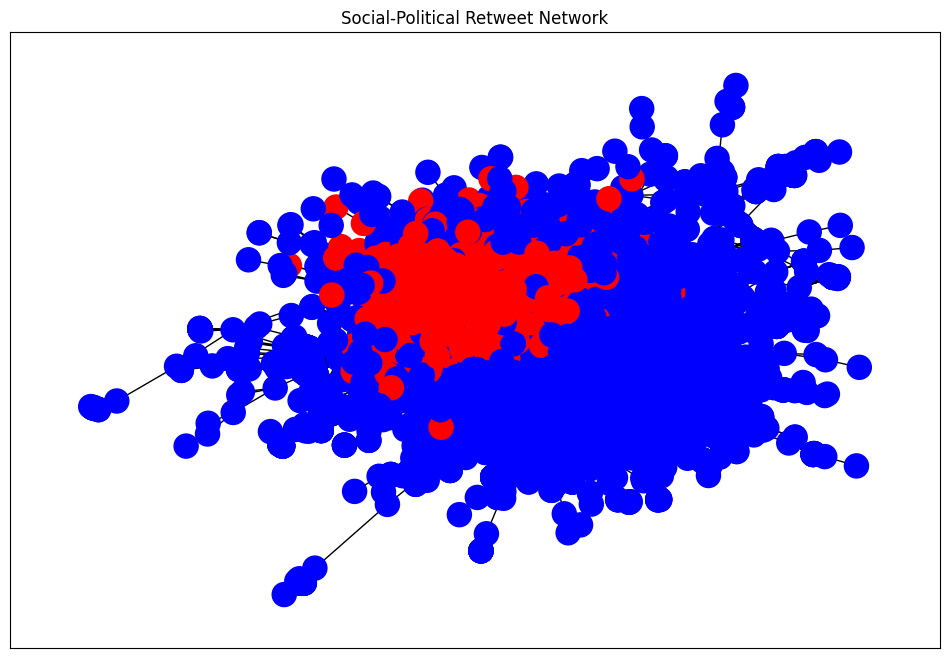

In [5]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load data from files
node_labels_df = pd.read_csv('C:\\Users\\DELL\\OneDrive\Desktop\\CSC3356_Project3\\soc-political-retweet_node_labels.csv', header=None, names=['node', 'label'])
edges_df = pd.read_csv('C:\\Users\\DELL\\OneDrive\Desktop\\CSC3356_Project3\\soc-political-retweet_edges.csv', header=None, names=['source', 'target', 'timestamp'])

# Convert DataFrame to dictionary for labels
node_labels = pd.Series(node_labels_df.label.values,index=node_labels_df.node).to_dict()

# Create the graph
G = nx.Graph()
for node, label in node_labels.items():
    G.add_node(node, label=label)

# Adding edges from DataFrame and include timestamp as an edge attribute
for _, row in edges_df.iterrows():
    G.add_edge(row['source'], row['target'], timestamp=row['timestamp'])

# Color mapping based on political alignment
color_map = {1: 'red', 2: 'blue'}  # 1: right, 2: left
node_colors = [color_map[G.nodes[node]['label']] for node in G if 'label' in G.nodes[node]]

# Draw the graph
plt.figure(figsize=(12, 8))
nx.draw_networkx(G, node_color=node_colors, with_labels=False, node_size=300, font_size=10)
plt.title('Social-Political Retweet Network')
plt.show()


In [11]:
!pip install plotly
!pip install netwulf

^C



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [13]:
import plotly.graph_objects as go
from netwulf import visualize

# Use netwulf for simple interactive visualization
visualize(G)

# More customized visualization using Plotly
pos = nx.spring_layout(G)  # Position nodes using Fruchterman-Reingold force-directed algorithm

edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        color=list(nx.get_node_attributes(G, 'label').values()),
        colorbar=dict(
            thickness=15,
            title='Political Alignment',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Network graph made with Python',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Python code: NetworkX+Plotly",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()


KeyboardInterrupt: 

In [ ]:
!pip install plotly
!pip install netwulf

In [7]:
import plotly.graph_objects as go
import networkx as nx
from netwulf import visualize

# Assuming 'G' is already defined and constructed

# Simple Interactive Visualization using Netwulf
visualize(G)

# Advanced Customized Visualization using Plotly
pos = nx.spring_layout(G)  # Position nodes using Fruchterman-Reingold force-directed algorithm

# Edge Trace for Plotly Graph
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])  # None is for discontinuous lines
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Node Trace for Plotly Graph
node_x = []
node_y = []
node_info = []  # For hover text
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_info.append(f'{node}<br># of connections: {len(G[node])}')

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_info,
    marker=dict(
        showscale=True,
        colorscale='YlOrRd',
        size=10,
        color=[G.nodes[node]['label'] for node in G],  # Use node labels as colors
        colorbar=dict(
            thickness=15,
            title='Political Alignment',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='Interactive Network Graph of Social-Political Retweet Data',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20, l=5, r=5, t=40),
                annotations=[{
                    "text": "Python code: NetworkX+Plotly",
                    "showarrow": False,
                    "xref": "paper", "yref": "paper",
                    "x": 0.005, "y": -0.002
                }],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()


KeyboardInterrupt: 

In [8]:
import plotly.graph_objects as go
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'G' is your previously defined NetworkX graph

# Calculate the position of nodes using a layout algorithm
pos = nx.spring_layout(G)

# Prepare data for edges to be used in Plotly
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])  # None creates disjointed lines in Plotly
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Prepare data for nodes to be used in Plotly
node_x = []
node_y = []
node_info = []  # for hover text
node_sizes = []  # to store node sizes based on degree

for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_info.append(f'{node}<br># of connections: {len(G[node])}')
    node_sizes.append(5 + 10 * len(G[node]))  # Size factor adjusted for visibility

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_info,
    marker=dict(
        showscale=True,
        colorscale='YlOrRd',
        size=node_sizes,
        color=[G.nodes[node]['label'] for node in G],  # using political alignment for color
        colorbar=dict(
            thickness=15,
            title='Political Alignment',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Define the layout of the plot
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='Interactive Network Graph with Node Size Based on Degree',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20, l=5, r=5, t=40),
                annotations=[{
                    "text": "Node size reflects number of connections",
                    "showarrow": False,
                    "xref": "paper", "yref": "paper",
                    "x": 0.005, "y": -0.002
                }],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

# Show the plot
fig.show()


In [ ]:
!pip install networkx matplotlib seaborn



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


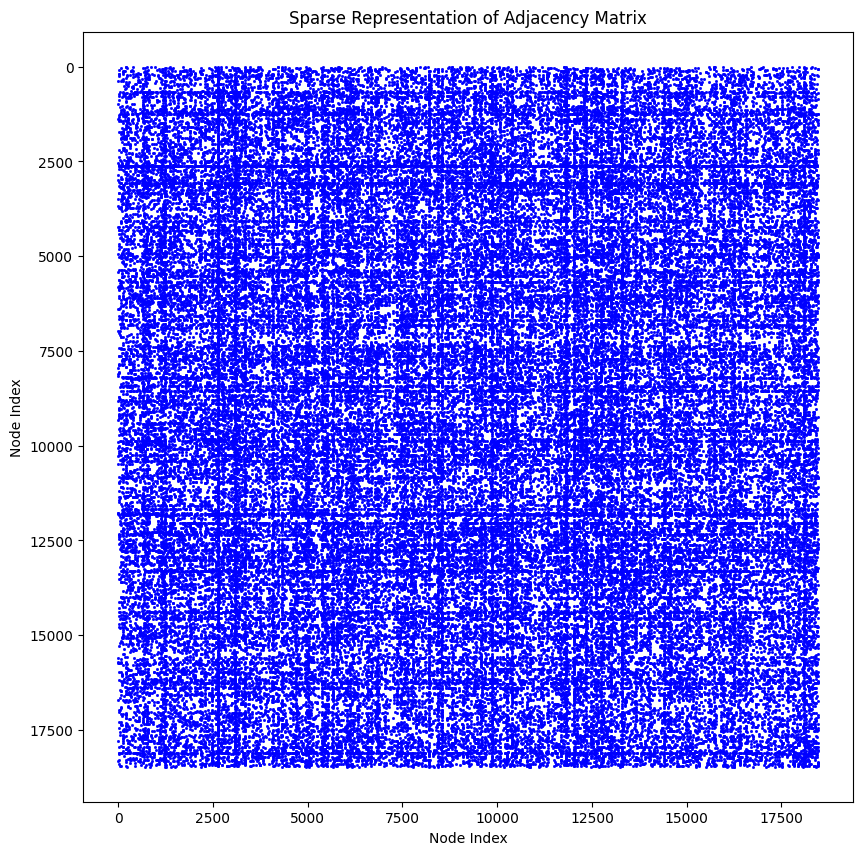

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
import seaborn as sns

# Assuming 'G' is previously defined and is a large graph
# Get the adjacency matrix as a sparse matrix
adj_matrix_sparse = nx.adjacency_matrix(G)

# Plotting directly using sparse matrix properties
fig, ax = plt.subplots(figsize=(10, 10))
# Find non-zero entries in the sparse matrix to plot
x, y = adj_matrix_sparse.nonzero()
ax.plot(y, x, 's', color='blue', ms=1)  # 's' for square markers, ms is marker size
ax.set_aspect('equal')
ax.invert_yaxis()  # To match the layout from top to bottom
plt.title('Sparse Representation of Adjacency Matrix')
plt.xlabel('Node Index')
plt.ylabel('Node Index')
plt.show()


In [7]:
# Add node attributes for labels
node_labels = pd.Series(node_labels_df.label.values, index=node_labels_df.node).to_dict()
nx.set_node_attributes(G, node_labels, 'label')

# Manipulation 1: Filter nodes by degree
min_degree = 10  # Threshold for degree
nodes_with_high_degree = [node for node, degree in G.degree() if degree >= min_degree]
subgraph = G.subgraph(nodes_with_high_degree)

# Manipulation 2: Aggregate edges to count retweets between nodes
# This step assumes edges_df has multiple entries for the same source-target pairs
edge_count_df = edges_df.groupby(['source', 'target']).size().reset_index(name='weight')
# Create a new graph with this aggregated information
weighted_graph = nx.from_pandas_edgelist(edge_count_df, 'source', 'target', edge_attr='weight', create_using=nx.Graph())

# Calculate positions using a layout algorithm
pos = nx.spring_layout(weighted_graph)

# Prepare Plotly traces
edge_trace = []
for edge in weighted_graph.edges(data=True):
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    weight = edge[2]['weight']
    edge_trace.append(go.Scatter(x=[x0, x1, None], y=[y0, y1, None],
                                 line=dict(width=weight/5, color='grey'),
                                 hoverinfo='none',
                                 mode='lines'))

node_trace = go.Scatter(
    x=[pos[node][0] for node in weighted_graph],
    y=[pos[node][1] for node in weighted_graph],
    text=[f'{node} (connections: {weighted_graph.degree(node)})' for node in weighted_graph],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=[5 * weighted_graph.degree(node) for node in weighted_graph],
        color=[weighted_graph.nodes[node]['label'] for node in weighted_graph],
        colorbar=dict(title='Political Alignment'),
        line_width=2))

# Define the layout of the plot
fig = go.Figure(data=edge_trace + [node_trace],
                layout=go.Layout(
                    title='Network Graph of Social-Political Retweet Data',
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))

# Show the plot
fig.show()

KeyboardInterrupt: 